In [1]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn' # type: ignore
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import folium


# LECTURA DE LOS DATOS

In [2]:
# Lista de nombres de archivos
files = ['GASTO_TURISTICO_2019.csv', 'GASTO_TURISTICO_2021.csv',
         'GASTO_TURISTICO_2022Q1.csv', 'GASTO_TURISTICO_2022Q2.csv', 'GASTO_TURISTICO_2022Q3.csv',]

# Lista vacía para almacenar los diferentes de datos
frames = []
for file in files:
    # Leer archivo CSV
    data = pd.read_csv('./datos/' + file, sep=';', usecols=('SEXO', 'EDAD', 'PAIS_RESIDENCIA', 'TRIMESTRE', 'GASTO_EUROS', 'DESGLOSE_EXTRA_ALOJ', 'DESGLOSE_PASAJES_ISLAS', 'DESGLOSE_TAXI', 'DESGLOSE_ALQ_VEHIC', 'DESGLOSE_TRANSP_PUBLICO', 'DESGLOSE_ALIM_SUPER', 'DESGLOSE_RESTAURANT', 'DESGLOSE_EXCURS_ORGANIZ', 'DESGLOSE_DEPORTES', 'DESGLOSE_ACTIV_CULTURAL', 'DESGLOSE_MUSEOS',
                       'DESGLOSE_PARQUES_OCIO', 'DESGLOSE_DISCOTECAS', 'DESGLOSE_SALUD', 'DESGLOSE_SOUVENIRS', 'DESGLOSE_BIENES_INMUEBLES', 'DESGLOSE_OTRAS_COMPRAS', 'DESGLOSE_FARMACIA', 'DESGLOSE_OTROS_GASTOS', 'NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF', 'NOCHES_LG', 'NOCHES_LP', 'NOCHES_EH', 'NOCHES_CRUCERO', 'NOCHES', 'PRIMERA_VISITA_CANARIAS'), encoding='latin-1')
    frames.append(data)

# Concatenar marcos de datos
main_df = pd.concat(frames)
main_df['GASTO_EUROS'] = main_df['GASTO_EUROS'].str.replace(',', '.')


### COMPROBACIÓN DE QUE ESTÉN CARGADOS

In [3]:
main_df


,SEXO,EDAD,PAIS_RESIDENCIA,NOCHES_LZ,NOCHES_FV,NOCHES_GC,NOCHES_TF,NOCHES_LG,NOCHES_LP,NOCHES_EH,...,DESGLOSE_PARQUES_OCIO,DESGLOSE_DISCOTECAS,DESGLOSE_SALUD,DESGLOSE_SOUVENIRS,DESGLOSE_BIENES_INMUEBLES,DESGLOSE_OTRAS_COMPRAS,DESGLOSE_FARMACIA,DESGLOSE_OTROS_GASTOS,PRIMERA_VISITA_CANARIAS,TRIMESTRE
0,6,68,GBR826,10,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,6,2019Q1
1,1,53,IRL372,3,0,0,0,0,0,0,...,0,50,0,10,0,0,0,0,6,2019Q1
2,6,22,FRA250,5,0,0,0,0,0,0,...,0,0,0,"11,363636364",0,0,0,0,1,2019Q1
3,1,70,FRA250,18,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2019Q1
4,6,34,FRA250,5,0,0,0,0,0,0,...,0,0,"12,195121951","23,170731707",0,0,0,0,6,2019Q1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11301,6,44,IRL372,0,0,0,3,0,0,0,...,0,"30,769230769",0,"6,1538461538",0,0,0,0,1,2022Q3
11302,6,27,IRL372,0,0,0,6,0,0,0,...,0,0,0,"48,477876532",0,0,"6,463716871",0,6,2022Q3
11303,6,19,IRL372,0,0,0,7,0,0,0,...,0,0,0,"71,428571429",0,0,0,0,6,2022Q3
11304,6,21,IRL372,0,0,0,7,0,0,0,...,"4,7477744807",0,"14,836795252","11,869436202",0,0,0,0,1,2022Q3


# GRÁFICA DE TARTA NÚMERO DE TURISTAS ENCUESTADOS SEGÚN GRUPO DE EDAD

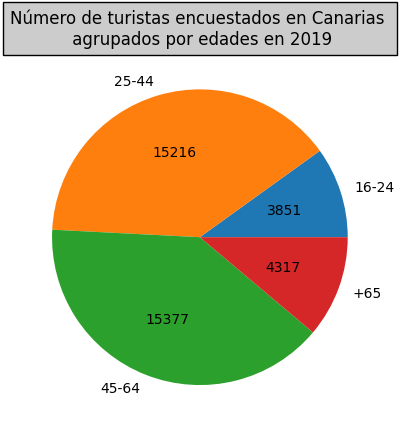

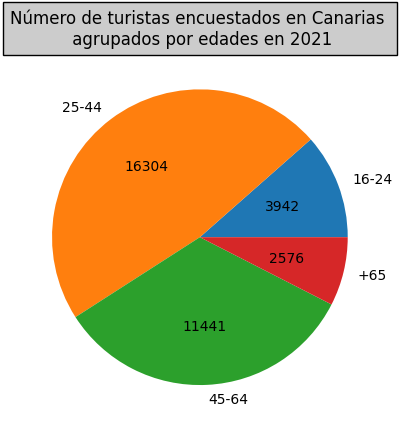

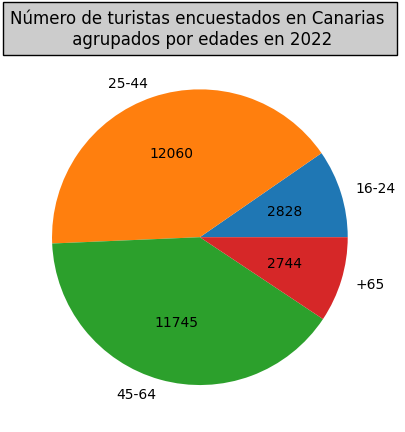

In [4]:
from collections import OrderedDict

Trimester = main_df.TRIMESTRE.unique()
Years = list(OrderedDict.fromkeys([s[:4] for s in Trimester]))

age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]

# Iterar Years si se quiere por años o Trimester por trimestre
for time in Years:
    count_ages = []
    for pos in range(len(limit_ages)):
        if pos == len(limit_ages)-1:
            count_ages.append(((main_df.TRIMESTRE.str.contains(time)) & (
                main_df.EDAD > limit_ages[pos])).sum())
        else:
            count_ages.append(((main_df.TRIMESTRE.str.contains(time)) & (
                main_df.EDAD > limit_ages[pos]) & (main_df.EDAD <= limit_ages[pos+1])).sum())

    plt.pie(count_ages, labels=age_ranges,
            autopct=lambda x: '{:.0f}'.format(x*sum(count_ages)/100))
    plt.title("Número de turistas encuestados en Canarias \n agrupados por edades en " +
              time, bbox={'facecolor': '0.8', 'pad': 5})
    plt.show()


# GRÁFICA DE BARRAS SEXO DE LOS TURISTAS ENCUESTADOS

[]

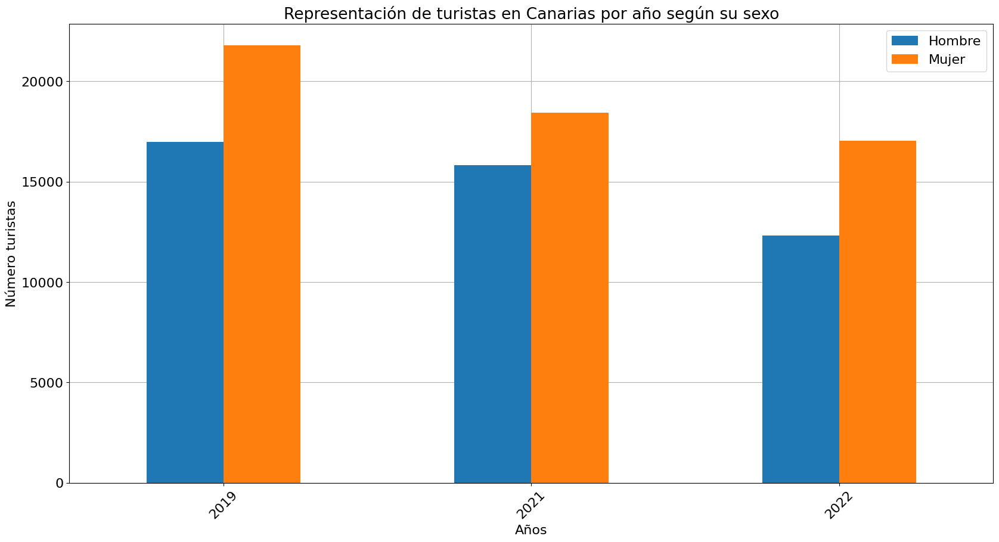

In [5]:
trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))

sexs = ['Hombre', 'Mujer']
sex_id = [1, 6]

zeros_array = np.zeros((len(years), len(sexs)), dtype=int)

y = 0
for time in years:
    zeros_array[y][0] = len(
        main_df[(main_df.SEXO == sex_id[0]) & (main_df.TRIMESTRE.str.contains(time))])
    zeros_array[y][1] = len(
        main_df[(main_df.SEXO == sex_id[1]) & (main_df.TRIMESTRE.str.contains(time))])
    y += 1

plt.rcParams.update({'font.size': 16})
sexs_df = pd.DataFrame(zeros_array, index=years, columns=sexs)
ax = sexs_df.plot.bar(figsize=(20, 10))
ax.set_title(
    "Representación de turistas en Canarias por año según su sexo", color='black')
ax.set_xlabel("Años")
ax.set_ylabel("Número turistas")
ax.grid(True)
ax.set_axisbelow(True)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.tick_params(axis='x', rotation=45)
ax.plot()


# GRÁFICA DE BARRAS SOBRE TURISTAS ENCUESTADOS SEGÚN SU PAÍS DE RESIDENCIA

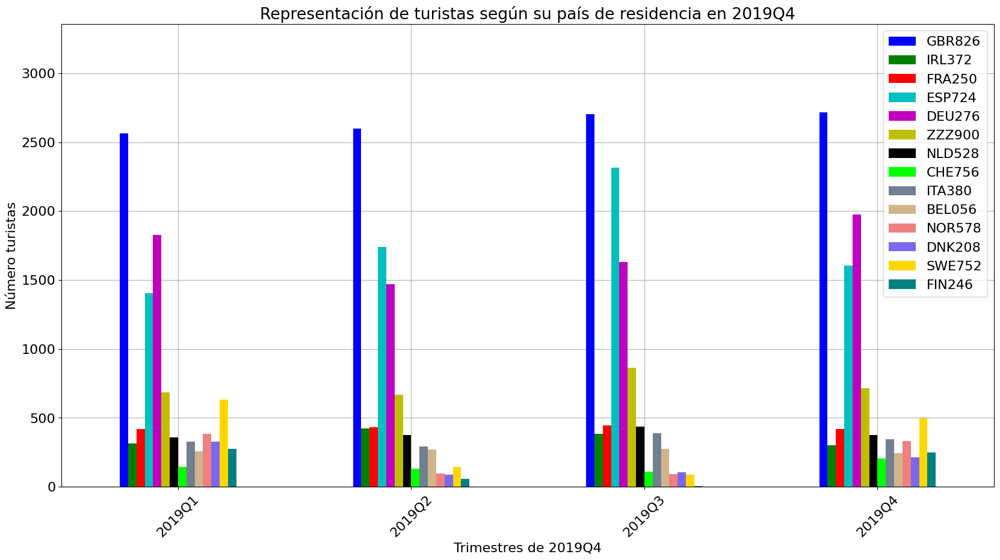

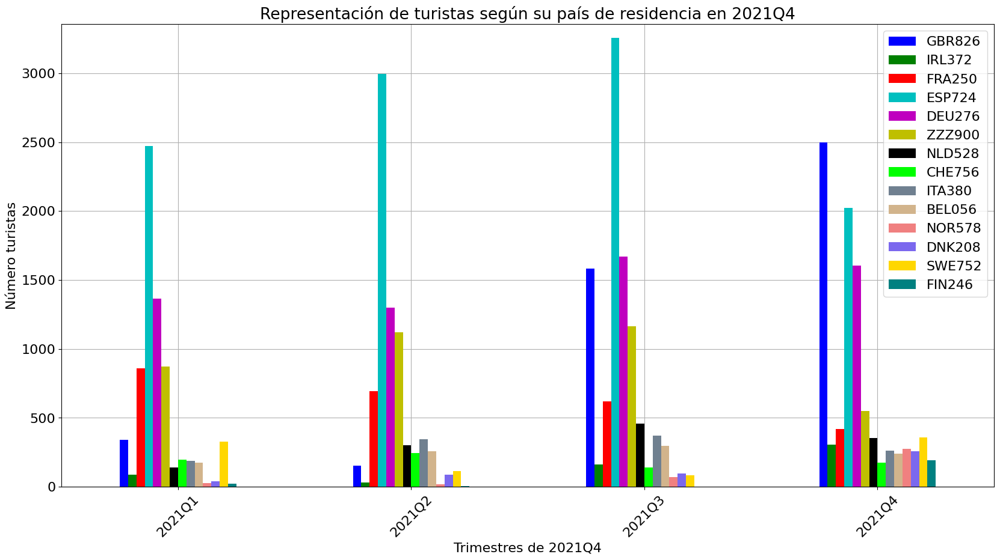

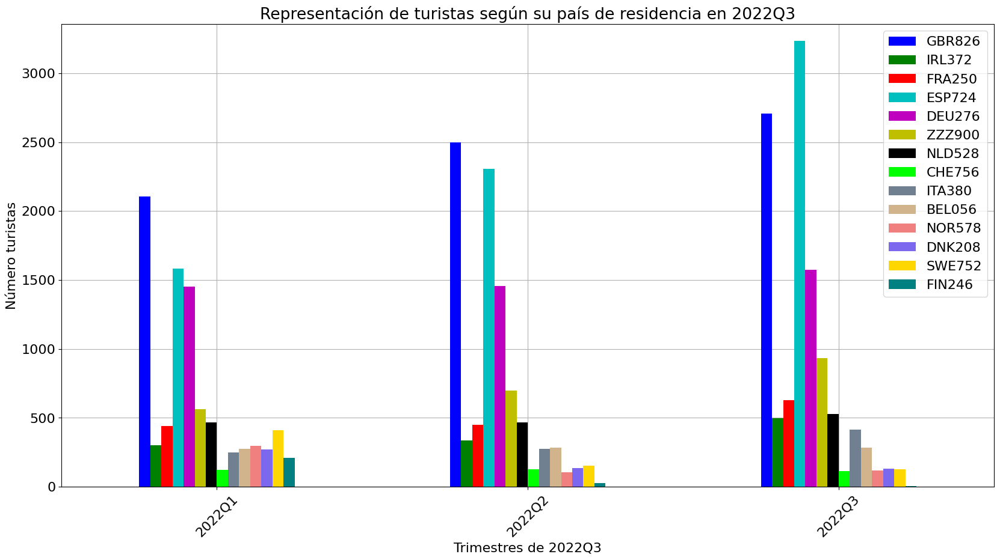

In [6]:
trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))
countries = main_df.PAIS_RESIDENCIA.unique()

# Hallamos el número máximo de turistas encuestados que residen en un mismo país durante los 3 años,
# para usar dicho valor en el eje y de las gráficas
max_tourist = 0
for location in countries:
    for time in trimester:
        if (len(main_df[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE == time)])) > max_tourist:
            max_tourist = (
                len(main_df[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE == time)]))

for time in years:

    trimester_by_year = [x for x in trimester if time in x]

    tourists_by_country = np.zeros((len(trimester_by_year), len(countries)), dtype=int)

    i = 0
    for location in countries:
        j = 0
        for time in trimester_by_year:
            tourists_by_country[j][i] = len(
                main_df[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE == time)])
            j += 1
        i += 1

    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'lime', 'slategrey',
              'tan', 'lightcoral', 'mediumslateblue', 'gold', 'teal', 'royalblue']

    df = pd.DataFrame(tourists_by_country, index=trimester_by_year, columns=countries)
    ax = df.plot.bar(color=colors, figsize=(20, 10))
    ax.set_title(
        "Representación de turistas según su país de residencia en " + time, color='black')
    ax.set_xlabel("Trimestres de " + time)
    ax.set_ylabel("Número turistas")
    ax.set_ylim([0, max_tourist+100])
    ax.grid(True)
    ax.set_axisbelow(True)
    ax.legend(bbox_to_anchor=(1.0, 1.0))
    ax.tick_params(axis='x', rotation=45)
    ax.plot()


# MAPA DE CALOR SOBRE TURISTAS ENCUESTADOS SEGÚN SU PAÍS DE RESIDENCIA

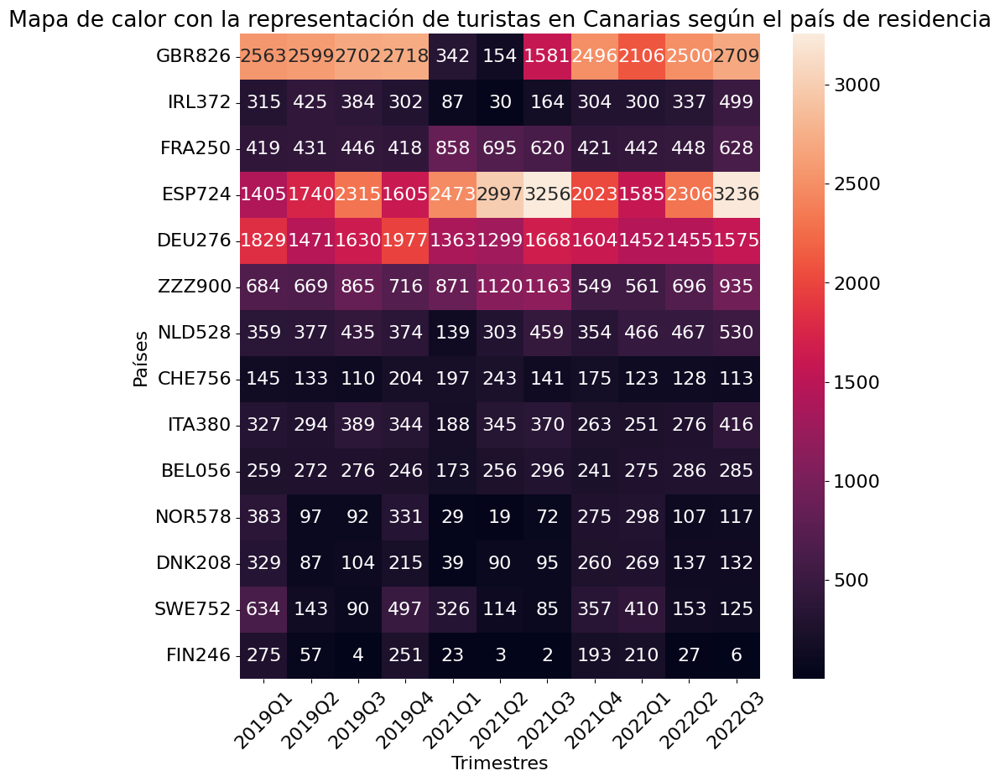

In [7]:
Trimester = main_df.TRIMESTRE.unique()
Countries = main_df.PAIS_RESIDENCIA.unique()

tourists_by_country = np.zeros((len(Countries), len(Trimester)), dtype=int)

x = 0
for location in Countries:
    y = 0
    for tri in Trimester:
        tourists_by_country[x][y] = len(
            main_df[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE == tri)])
        y += 1
    x += 1

tourists_by_location_df = pd.DataFrame(
    tourists_by_country, index=Countries, columns=Trimester)
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(tourists_by_location_df, annot=True, fmt='g')
ax.set_title(
    "Mapa de calor con la representación de turistas en Canarias según el país de residencia")
ax.set_xlabel("Trimestres")
ax.set_ylabel("Países")
ax.tick_params(axis='x', rotation=45)


# GRÁFICA DE LÍNEAS SOBRE NÚMERO TOTAL DE PERNOCTACIONES POR ISLA 



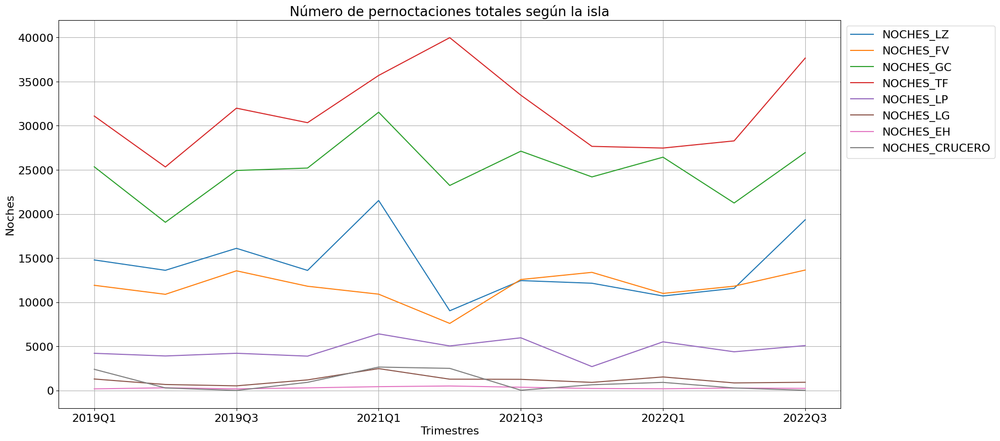

In [8]:
trimester = main_df.TRIMESTRE.unique()
age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]
overnights_cols = ['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF',
                   'NOCHES_LP', 'NOCHES_LG', 'NOCHES_EH', 'NOCHES_CRUCERO']

result = {overnight: [] for overnight in overnights_cols}
for time in trimester:
    query = (main_df['TRIMESTRE'] == time)
    for overnight in overnights_cols:
        result[overnight].append(main_df.loc[query, overnight].sum())

total_overnights_df = pd.DataFrame(result, index=trimester)
ax = total_overnights_df.plot.line(figsize=(20, 10))
ax.set_title("Número de pernoctaciones totales según la isla")
ax.set_xlabel("Trimestres")
ax.set_ylabel("Noches")
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(True)
ax.set_axisbelow(True)


# GRÁFICA DE LÍNEAS SOBRE NÚMERO DE MEDIA DE PERNOCTACIONES POR ISLA

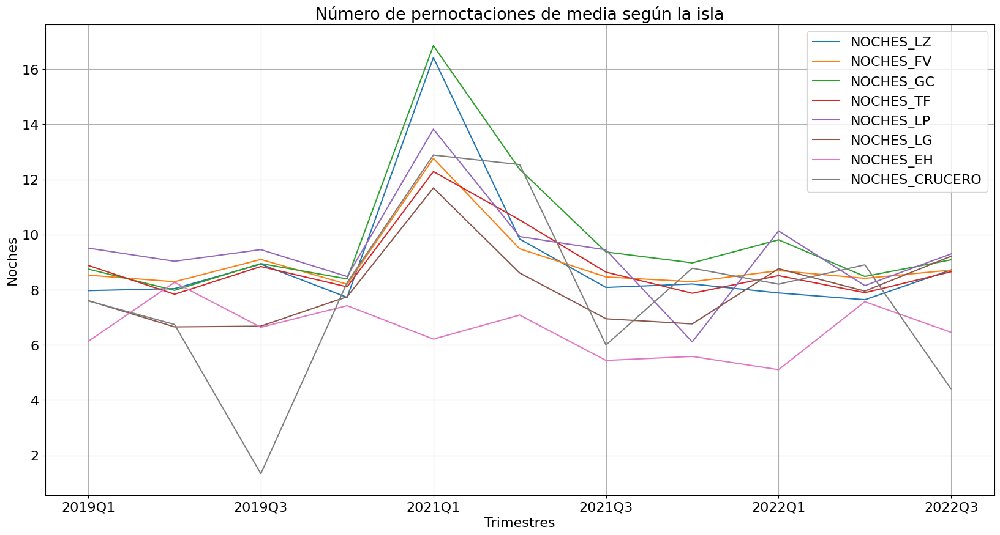

In [9]:
trimester = main_df.TRIMESTRE.unique()
age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]
overnights_cols = ['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF',
                   'NOCHES_LP', 'NOCHES_LG', 'NOCHES_EH', 'NOCHES_CRUCERO']

main_df_copy = main_df.copy()
main_df_copy = main_df_copy.replace(0, np.NaN)

result = {overnight: [] for overnight in overnights_cols}
for tri in trimester:
    query = (main_df_copy['TRIMESTRE'] == tri)
    for overnight in overnights_cols:
        result[overnight].append(main_df_copy.loc[query, overnight].mean())

mean_overnights_df = pd.DataFrame(result, index=trimester)

ax = mean_overnights_df.plot.line(figsize=(20, 10))
ax.set_title("Número de pernoctaciones de media según la isla")
ax.set_xlabel("Trimestres")
ax.set_ylabel("Noches")
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(True)
ax.set_axisbelow(True)


# GRÁFICA DE LÍNEAS SOBRE NÚMERO DE MEDIA DE PERNOCTACIONES POR ISLA AGRUPADO POR EDADES

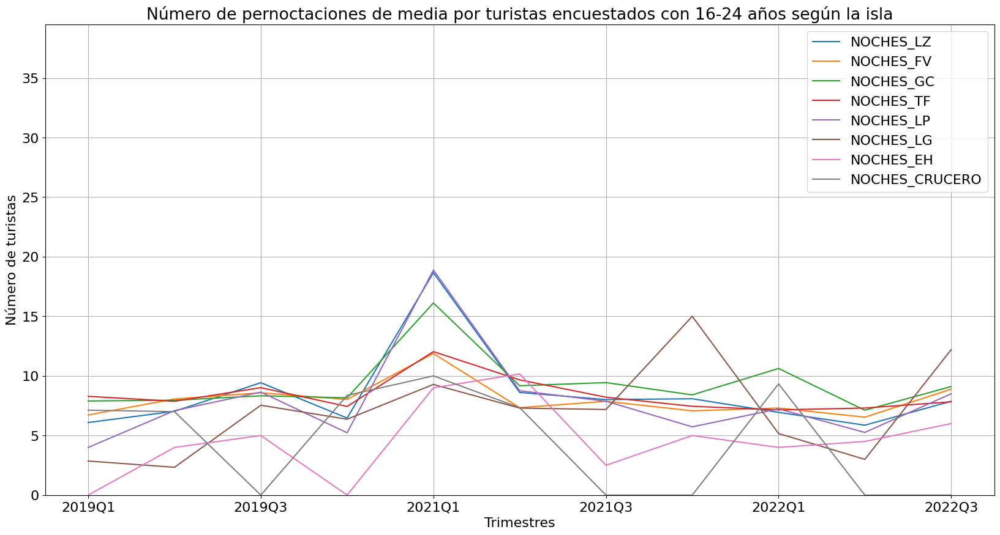

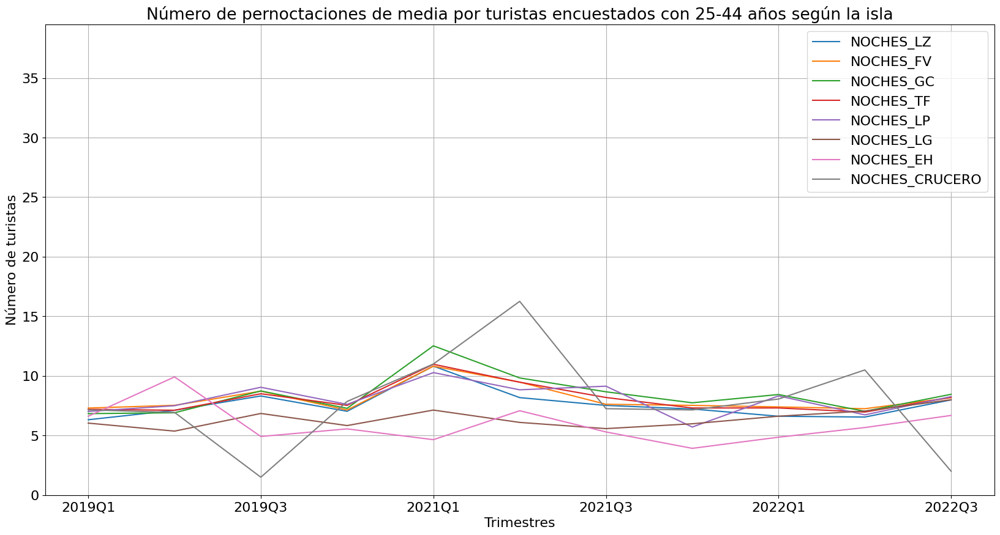

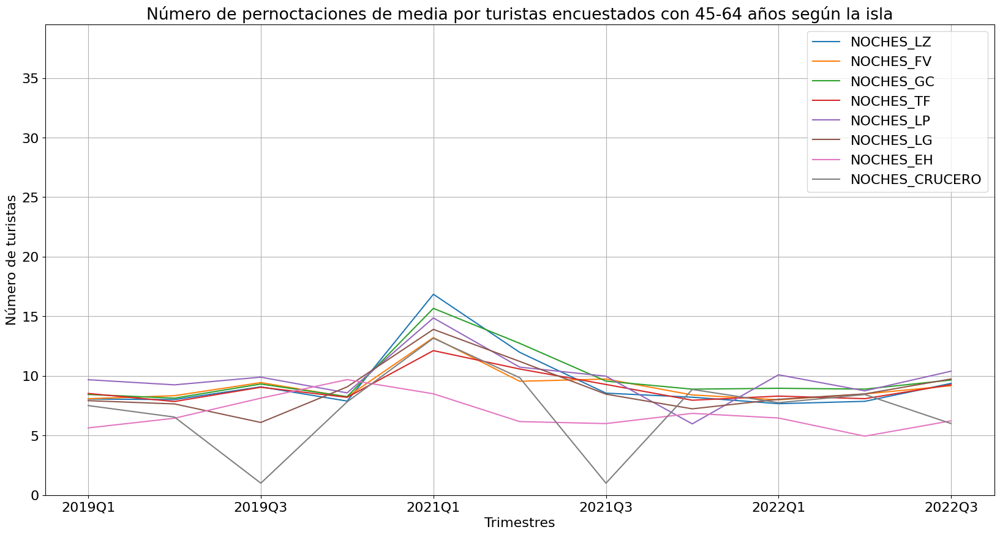

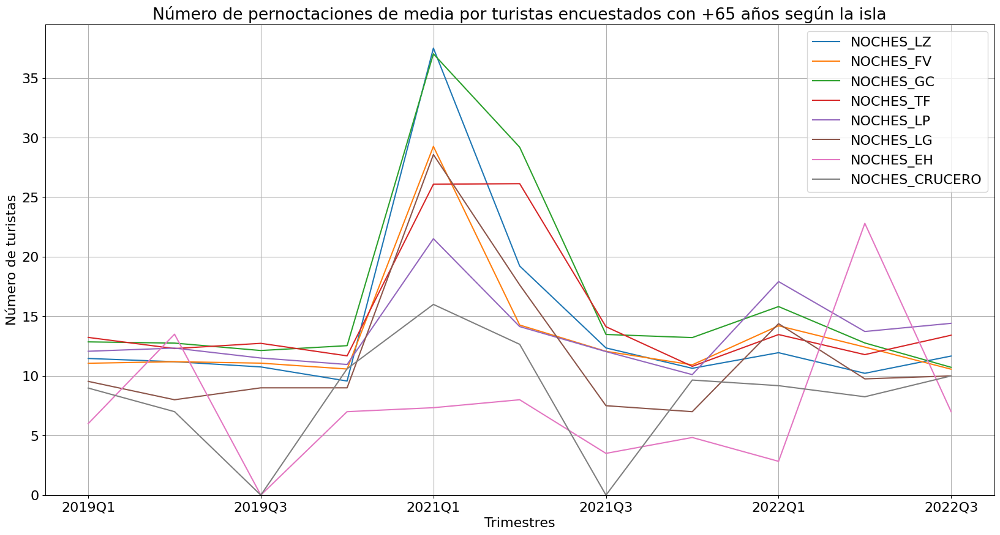

In [10]:
trimester = main_df.TRIMESTRE.unique()
age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]
overnights_cols = ['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF',
                   'NOCHES_LP', 'NOCHES_LG', 'NOCHES_EH', 'NOCHES_CRUCERO']

max_tourists = 0

main_df_copy = main_df.copy()
main_df_copy = main_df_copy.replace(0, np.NaN)

for pos_limit_ages in range(len(limit_ages)):
    result = {overnight: [] for overnight in overnights_cols}
    for time in trimester:
        if pos_limit_ages == len(limit_ages)-1:
            query = (main_df_copy['TRIMESTRE'] == time) & (
                main_df_copy['EDAD'] > limit_ages[pos_limit_ages])
        else:
            query = (main_df_copy['TRIMESTRE'] == time) & (main_df_copy['EDAD'] > limit_ages[pos_limit_ages]) & (
                main_df_copy['EDAD'] <= limit_ages[pos_limit_ages+1])
        for overnight in overnights_cols:
            if (main_df_copy.loc[query, overnight].mean()) > max_tourists:
                max_tourists = main_df_copy.loc[query, overnight].mean()

for pos_limit_ages in range(len(limit_ages)):
    result = {overnight: [] for overnight in overnights_cols}
    for time in trimester:
        if pos_limit_ages == len(limit_ages)-1:
            query = (main_df_copy['TRIMESTRE'] == time) & (
                main_df_copy['EDAD'] > limit_ages[pos_limit_ages])
        else:
            query = (main_df_copy['TRIMESTRE'] == time) & (main_df_copy['EDAD'] > limit_ages[pos_limit_ages]) & (
                main_df_copy['EDAD'] <= limit_ages[pos_limit_ages+1])
        for overnight in overnights_cols:
            result[overnight].append(main_df_copy.loc[query, overnight].mean())

    mean_overnights_df = pd.DataFrame(result, index=trimester)
    mean_overnights_df = mean_overnights_df.replace(np.NaN, 0)

    lines = mean_overnights_df.plot.line(figsize=(20, 10))
    ax = plt.gca()
    ax.set_ylim([0, max_tourists+2])
    ax.set_title("Número de pernoctaciones de media por turistas encuestados con " +
                 age_ranges[pos_limit_ages] + " años según la isla")
    ax.set_xlabel("Trimestres")
    ax.set_ylabel("Número de turistas")
    ax.grid(True)
    ax.set_axisbelow(True)


# DIAGRAMA DE ÁRBOL SOBRE EL NIVEL DE GASTO TOTAL EN CADA TIPO POR ISLA Y AÑO

In [11]:
# Limpiamos de los datos aquellos encuestaods que hayan estado en más de una isla

main_df_copy = main_df.copy()
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_TF'] > 0) & (
    main_df_copy['NOCHES_TF'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_LZ'] > 0) & (
    main_df_copy['NOCHES_LZ'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_FV'] > 0) & (
    main_df_copy['NOCHES_FV'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_GC'] > 0) & (
    main_df_copy['NOCHES_GC'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_EH'] > 0) & (
    main_df_copy['NOCHES_EH'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_LP'] > 0) & (
    main_df_copy['NOCHES_LP'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_LG'] > 0) & (
    main_df_copy['NOCHES_LG'] < main_df_copy['NOCHES'])].index, inplace=True)
main_df_copy.drop(main_df_copy[(main_df_copy['NOCHES_CRUCERO'] > 0) & (
    main_df_copy['NOCHES_CRUCERO'] < main_df_copy['NOCHES'])].index, inplace=True)

# Creamos columna Isla donde se representará la isla donde ha estado el turista
conditionlist = [
    (main_df_copy['NOCHES_TF'] > 0),
    (main_df_copy['NOCHES_LZ'] > 0),
    (main_df_copy['NOCHES_FV'] > 0),
    (main_df_copy['NOCHES_GC'] > 0),
    (main_df_copy['NOCHES_EH'] > 0),
    (main_df_copy['NOCHES_LP'] > 0),
    (main_df_copy['NOCHES_LG'] > 0),
    (main_df_copy['NOCHES_CRUCERO'] > 0)]
choicelist = ['TNF', 'LZ', 'FV', 'GC', 'EH', 'LP', 'LG', 'CRU']
main_df_copy['ISLA'] = np.select(
    conditionlist, choicelist, default='Not Specified')

# Cambiamos la , por un . de los valores de gasto para poder trabajar con ellos con el float
columns_to_replace = ['DESGLOSE_EXTRA_ALOJ', 'DESGLOSE_PASAJES_ISLAS', 'DESGLOSE_TAXI',
                      'DESGLOSE_ALQ_VEHIC', 'DESGLOSE_TRANSP_PUBLICO', 'DESGLOSE_ALIM_SUPER',
                      'DESGLOSE_RESTAURANT', 'DESGLOSE_EXCURS_ORGANIZ', 'DESGLOSE_DEPORTES',
                      'DESGLOSE_ACTIV_CULTURAL', 'DESGLOSE_MUSEOS', 'DESGLOSE_PARQUES_OCIO',
                      'DESGLOSE_DISCOTECAS', 'DESGLOSE_SALUD', 'DESGLOSE_SOUVENIRS',
                      'DESGLOSE_BIENES_INMUEBLES', 'DESGLOSE_OTRAS_COMPRAS',
                      'DESGLOSE_FARMACIA', 'DESGLOSE_OTROS_GASTOS']

main_df_copy[columns_to_replace] = main_df_copy[columns_to_replace].replace(
    ',', '.', regex=True)

# Creamos dataframe con trimestre e isla
costs_df = main_df_copy[['TRIMESTRE', 'ISLA']]

# Creamos columna para cada tipo de gasto con su valor en euros
costs_df['ALOJAMIENTO_EXTRA'] = main_df_copy.DESGLOSE_EXTRA_ALOJ.astype(
    float) * main_df_copy.GASTO_EUROS.astype(float) / 100
costs_df['TRANSPORTE'] = (main_df_copy.DESGLOSE_PASAJES_ISLAS.astype(float) + main_df_copy.DESGLOSE_TAXI.astype(float) +
                          main_df_copy.DESGLOSE_TRANSP_PUBLICO.astype(float) + main_df_copy.DESGLOSE_ALQ_VEHIC.astype(float)) * main_df_copy.GASTO_EUROS.astype(float) / 100
costs_df['ALIMENTACION'] = (main_df_copy.DESGLOSE_ALIM_SUPER.astype(
    float) + main_df_copy.DESGLOSE_RESTAURANT.astype(float)) * main_df_copy.GASTO_EUROS.astype(float) / 100
costs_df['OCIO'] = (main_df_copy.DESGLOSE_EXCURS_ORGANIZ.astype(float) + main_df_copy.DESGLOSE_DEPORTES.astype(float) + main_df_copy.DESGLOSE_ACTIV_CULTURAL.astype(float) + main_df_copy.DESGLOSE_MUSEOS.astype(
    float) + main_df_copy.DESGLOSE_PARQUES_OCIO.astype(float) + main_df_copy.DESGLOSE_DISCOTECAS.astype(float) + main_df_copy.DESGLOSE_SALUD.astype(float)) * main_df_copy.GASTO_EUROS.astype(float) / 100
costs_df['COMPRA_BIENES'] = (main_df_copy.DESGLOSE_SOUVENIRS.astype(float) + main_df_copy.DESGLOSE_BIENES_INMUEBLES.astype(
    float) + main_df_copy.DESGLOSE_OTRAS_COMPRAS.astype(float)) * main_df_copy.GASTO_EUROS.astype(float) / 100
costs_df['OTROS'] = (main_df_copy.DESGLOSE_FARMACIA.astype(
    float) + main_df_copy.DESGLOSE_OTROS_GASTOS.astype(float)) * main_df_copy.GASTO_EUROS.astype(float) / 100

# Convertimos las columnas creadas en valores dentro de dos columnas
costs_treemap_df = costs_df.melt(id_vars=["TRIMESTRE", "ISLA"],
                                 var_name="TIPO_GASTO",
                                 value_name="GASTO")

# Quitamos las filas cuyo gasto sea 0 para no representarlas
costs_treemap_df = costs_treemap_df[costs_treemap_df['GASTO'] != 0]

# Quitamos los trimestres para trabajar con años
costs_treemap_df['TRIMESTRE'] = costs_treemap_df['TRIMESTRE'].str.split(
    'Q').str[0]

trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))

color_map = {
    'LG': '#19d3f3',
    'LZ': '#ab63fa',
    'GC': '#00cc96',
    'FV': '#ffa15a',
    'TNF': '#636efa',
    'LP': '#ef553b',
    'EH': '#ff6692',
    'CRU': '#b6e880'
}

df_colors = pd.DataFrame.from_dict(
    color_map, orient='index', columns=['COLOR'])

# Unir el DataFrame de colores con el DataFrame original por la columna ISLA
costs_treemap_df = costs_treemap_df.merge(
    df_colors, left_on='ISLA', right_index=True, how='left')

# Representamos treemap de cada año

for time in years:
    fig = px.treemap(costs_treemap_df[costs_treemap_df['TRIMESTRE'] == time],
                     path=['TRIMESTRE', 'ISLA', 'TIPO_GASTO'],
                     values='GASTO'
                     )
    fig.update_layout(title_text='Diagrama de árbol con el total gastado en cada tipo de gasto en cada isla en ' + time,
                      font=dict(
                          size=16
                      ))

    fig.for_each_trace(
        lambda t: t.update(
            marker_colors=[
                color_map.get(
                    id.split("/")[1], None) if len(id.split("/")) > 1 else None
                for id in t.ids
            ]
        )
    )

    fig.data[0].textinfo = 'label+value'
    fig.show()


# DIAGRAMA DE ÁRBOL SOBRE LA MEDIANA DE GASTO EN CADA TIPO POR ISLA Y AÑO

In [12]:
costs_treemap_df = costs_treemap_df.groupby(
    ["TRIMESTRE", "ISLA", "TIPO_GASTO"], as_index=False)["GASTO"].mean()

trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))
countries = main_df.PAIS_RESIDENCIA.unique()

# Quitamos los trimestres para trabajar con años
costs_treemap_df['TRIMESTRE'] = costs_treemap_df['TRIMESTRE'].str.split(
    'Q').str[0]

years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))

# Representamos treemap de cada año

color_map = {
    'LG': '#19d3f3',
    'LZ': '#ab63fa',
    'GC': '#00cc96',
    'FV': '#ffa15a',
    'TNF': '#636efa',
    'LP': '#ef553b',
    'EH': '#ff6692',
    'CRU': '#b6e880'
}

color_df = pd.DataFrame.from_dict(color_map, orient='index', columns=['COLOR'])

# Unir el DataFrame de colores con el DataFrame original por la columna ISLA
costs_treemap_df = costs_treemap_df.merge(
    color_df, left_on='ISLA', right_index=True, how='left')

for time in years:
    fig = px.treemap(costs_treemap_df[costs_treemap_df['TRIMESTRE'] == time],
                     path=['TRIMESTRE', 'ISLA', 'TIPO_GASTO'],
                     values='GASTO',
                     color='COLOR',
                     )
    fig.update_layout(title_text='Diagrama de árbol con la media de gasto según el tipo de gasto en cada isla en ' + time, font=dict(
        size=16
    ))
    fig.for_each_trace(
        lambda t: t.update(
            marker_colors=[
                color_map.get(
                    id.split("/")[1], None) if len(id.split("/")) > 1 else None
                for id in t.ids
            ]
        )
    )
    fig.data[0].textinfo = 'label+value'

    fig.show()


# DIAGRAMA DE DISPERSIÓN SOBRE LA MEDIANA DE GASTO DE LA REPRESENTACIÓN DE TURISTAS SEGÚN LA CANTIDAD DE VISITANTES

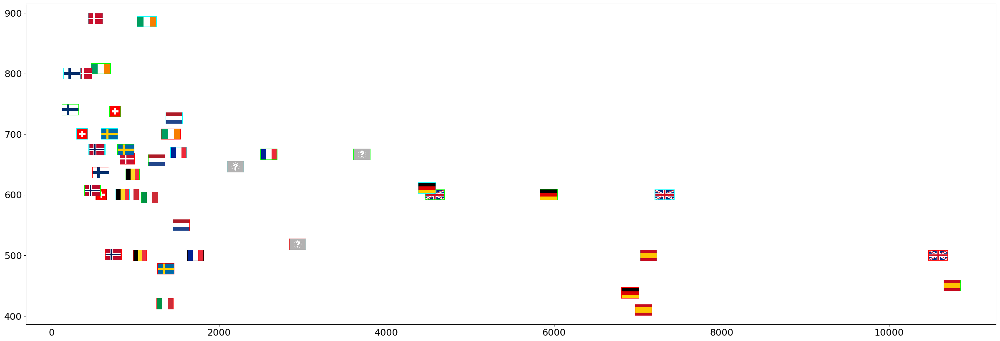

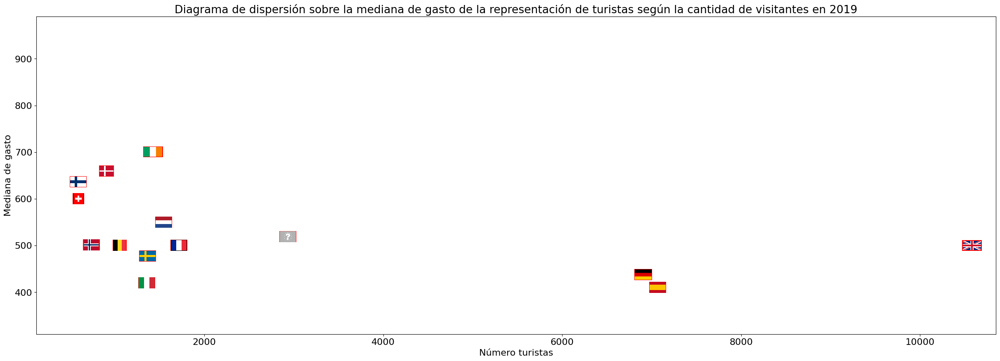

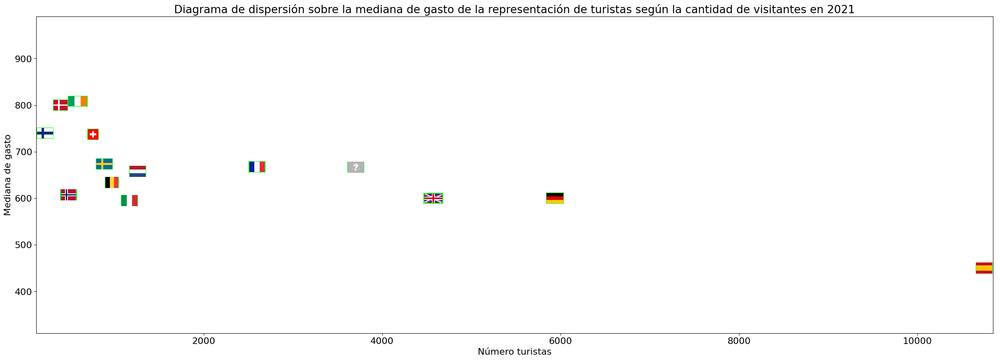

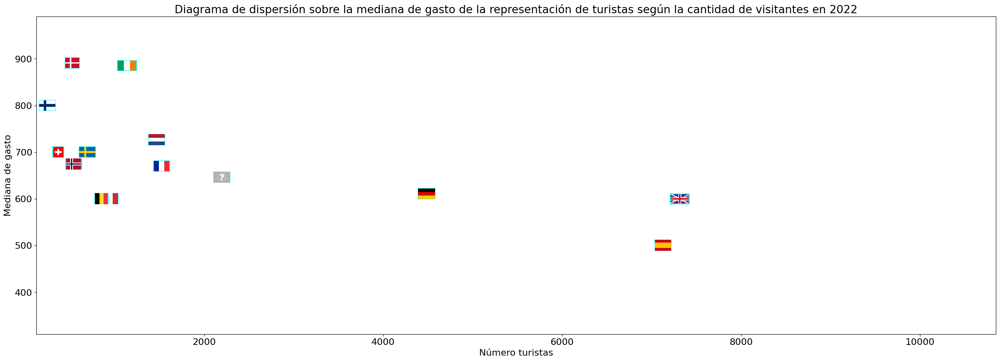

In [13]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


def getImage(path, zoom=0.015):
    return OffsetImage(plt.imread(path), zoom=0.04)


paths = [[
    './src/bandera/UK_2019.png',
    './src/bandera/Ireland_2019.png',
    './src/bandera/France_2019.png',
    './src/bandera/Spain_2019.png',
    './src/bandera/Germany_2019.png',
    './src/bandera/Unknown_2019.png',
    './src/bandera/Netherlands_2019.png',
    './src/bandera/Switzerland_2019.png',
    './src/bandera/Italy_2019.png',
    './src/bandera/Belgium_2019.png',
    './src/bandera/Denmark_2019.png',
    './src/bandera/Norway_2019.png',
    './src/bandera/Sweden_2019.png',
    './src/bandera/Finland_2019.png'], [
    './src/bandera/UK_2021.png',
    './src/bandera/Ireland_2021.png',
    './src/bandera/France_2021.png',
    './src/bandera/Spain_2021.png',
    './src/bandera/Germany_2021.png',
    './src/bandera/Unknown_2021.png',
    './src/bandera/Netherlands_2021.png',
    './src/bandera/Switzerland_2021.png',
    './src/bandera/Italy_2021.png',
    './src/bandera/Belgium_2021.png',
    './src/bandera/Denmark_2021.png',
    './src/bandera/Norway_2021.png',
    './src/bandera/Sweden_2021.png',
    './src/bandera/Finland_2021.png'], [
    './src/bandera/UK_2022.png',
    './src/bandera/Ireland_2022.png',
    './src/bandera/France_2022.png',
    './src/bandera/Spain_2022.png',
    './src/bandera/Germany_2022.png',
    './src/bandera/Unknown_2022.png',
    './src/bandera/Netherlands_2022.png',
    './src/bandera/Switzerland_2022.png',
    './src/bandera/Italy_2022.png',
    './src/bandera/Belgium_2022.png',
    './src/bandera/Denmark_2022.png',
    './src/bandera/Norway_2022.png',
    './src/bandera/Sweden_2022.png',
    './src/bandera/Finland_2022.png']]

trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))
countries = main_df.PAIS_RESIDENCIA.unique()

tourists_by_country = np.zeros((len(years), len(countries)), dtype=int)
median_cost_tourists = np.zeros((len(years), len(countries)), dtype=float)

main_df_copy = main_df.copy()
main_df_copy['GASTO_EUROS'] = main_df_copy['GASTO_EUROS'].astype(float)

x = 0
for location in countries:
    y = 0
    for time in years:
        tourists_by_country[y][x] = len(main_df_copy[(main_df_copy.PAIS_RESIDENCIA == location) & (
            main_df_copy.TRIMESTRE.str.contains(time))])
        # CAMBIAR TOTAL POR MEDIA EN EL GASTO
        # z[y][x] = nuevo_df.loc[(nuevo_df.PAIS_RESIDENCIA == pais) & (nuevo_df.TRIMESTRE.str.contains(time)), 'GASTO_EUROS'].mean()
        median_cost_tourists[y][x] = main_df_copy.loc[(main_df_copy.PAIS_RESIDENCIA == location) & (
            main_df_copy.TRIMESTRE.str.contains(time)), 'GASTO_EUROS'].median()
        y += 1
    x += 1

test = np.concatenate(tourists_by_country, axis=None)
test2 = np.concatenate(median_cost_tourists, axis=None)
test3 = np.concatenate((paths), axis=None)

max_x = np.max(test)
min_x = np.min(test)
max_y = np.max(test2)
min_y = np.min(test2)

# Todos los años juntos en una misma grafica
fig, ax = plt.subplots(figsize=(30, 10))
x = test
y = test2
ax.scatter(x, y)

for x0, y0, path in zip(x, y, test3):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

# Cada año su propia grafica
for iter in range(3):
    fig, ax = plt.subplots(figsize=(30, 10))
    x = tourists_by_country[iter]
    y = median_cost_tourists[iter]
    ruta = paths[iter]
    ax.scatter(x, y)
    ax.set_title(
        "Diagrama de dispersión sobre la mediana de gasto de la representación de turistas según la cantidad de visitantes en " + years[iter])
    ax.set_xlabel("Número turistas")
    ax.set_ylabel("Mediana de gasto")
    ax.set_xlim([min_x - 100, max_x + 100])
    ax.set_ylim([min_y - 100, max_y + 100])

    for x0, y0, path in zip(x, y, ruta):
        ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
        ax.add_artist(ab)


# FIDELIDAD DE LOS TURISTAS ENCUESTADOS EN FUNCIÓN DE SU MEDIANA DE GASTO Y AGRUPADOS POR EDAD

In [14]:
age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]

countries = main_df.PAIS_RESIDENCIA.unique()
trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))

for time in years:
    for pos_limit_ages in range(len(limit_ages)):
        new_tourists = []
        old_tourists = []
        total_tourists = []
        new_median_costs = []
        old_median_costs = []
        total_median_costs = []
        for location in countries:
            if pos_limit_ages < (len(limit_ages))-1:
                new_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PRIMERA_VISITA_CANARIAS == 1) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                old_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PRIMERA_VISITA_CANARIAS == 6) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                total_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PAIS_RESIDENCIA == location) & (
                    main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                new_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
                old_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
                total_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
            else:
                new_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                old_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                total_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                new_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())
                old_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())
                total_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (
                    main_df.TRIMESTRE.str.contains(time)) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())

        dict_median_costs = {'Paises': countries,
             'NUEVOS': new_tourists,
             'REPETIDORES': old_tourists,
             'MEDIANA_GASTO_NUEVO': new_median_costs,
             'MEDIANA_GASTO_REPE': old_median_costs,
             'MEDIANA_GASTO_TOTAL': total_median_costs,
             'TOTAL': total_tourists}

        df_median_costs = pd.DataFrame(dict_median_costs)

        df_median_costs[['MEDIANA_GASTO_NUEVO', 'MEDIANA_GASTO_REPE']] = df_median_costs[[
            'MEDIANA_GASTO_NUEVO', 'MEDIANA_GASTO_REPE']].round(2)

        df_median_costs['MEDIANA_GASTO_NUEVO'] = df_median_costs['MEDIANA_GASTO_NUEVO'].apply(
            lambda x: str(x) + ' €')
        df_median_costs['MEDIANA_GASTO_REPE'] = df_median_costs['MEDIANA_GASTO_REPE'].apply(
            lambda x: str(x) + ' €')

        df_median_costs['NUEVOS'] = (df_median_costs['NUEVOS'] / df_median_costs['TOTAL'])*100
        df_median_costs['REPETIDORES'] = (df_median_costs['REPETIDORES'] / df_median_costs['TOTAL'])*100

        df_median_costs = df_median_costs.sort_values(by=(['MEDIANA_GASTO_TOTAL']), ascending=False)

        fig = go.Figure(layout_yaxis_range=[0, 100])
        fig.add_trace(go.Bar(x=df_median_costs['Paises'],
                             y=df_median_costs['NUEVOS'],
                             orientation='v',
                             name='NUEVOS',
                             # texttemplate = "%{df[MEDIANA_GASTO_NUEVO]:$,s}",
                             text=df_median_costs['MEDIANA_GASTO_NUEVO'],
                             hovertemplate="%{y}: %{x}"))
        fig.add_trace(go.Bar(x=df_median_costs['Paises'],
                             y=df_median_costs['REPETIDORES'],
                             orientation='v',
                             name='REPETIDORES',
                             # texttemplate=str(str(df['MEDIANA_GASTO_REPE']) + "€"),
                             text=df_median_costs['MEDIANA_GASTO_REPE'],
                             hovertemplate="%{y}: %{x}"))

        fig.update_layout(barmode='relative',
                          bargap=0.01,
                          title="Porcentaje de turistas nuevos y repetidores entre " + age_ranges[pos_limit_ages] + " en " + str(time), font=dict(
                              size=16
                          )
                          )
        fig.show()

        fig = px.bar(df_median_costs, y=df_median_costs['TOTAL'], x=df_median_costs['Paises'], text_auto='.2s',
                     title="Visualización del número de encuestados según su país de residencia entre " + age_ranges[pos_limit_ages] + " en " + str(time))
        fig.update_layout(font=dict(
            size=16
        ))
        fig.show()

        # Representación de preferencia de islas de los turistas usando Folium

        df_median_costs = df_median_costs.head(3)

        islands = ['TFN', 'LZ', 'FV', 'GC', 'EH', 'LP', 'LG']
        overnights_islands = ['NOCHES_TF', 'NOCHES_LZ', 'NOCHES_FV',
                        'NOCHES_GC', 'NOCHES_EH', 'NOCHES_LP', 'NOCHES_LG']

        for countries_higher_media in df_median_costs.Paises.values:
            count_turist = []
            for overnight in overnights_islands:
                count_turist.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df[overnight] > 0) & (main_df.PAIS_RESIDENCIA == countries_higher_media)]))

            dict_median_costs = {'Isla': islands, 'Total_isla': count_turist}
            state_data = pd.DataFrame(data=dict_median_costs)

            folium_map = folium.Map(location=[28, -16],
                           zoom_start=8, min_zoom=8, max_zoom=8)

            folium.Choropleth(
                geo_data='./src/mapa_islas_canarias.json',
                name="choropleth",
                data=state_data,
                columns=["Isla", "Total_isla"],
                key_on="feature.id",
                fill_color="BuPu",
                fill_opacity=0.7,
                line_opacity=0.2,
                legend_name="Total de turistas",
            ).add_to(folium_map)

            folium.LayerControl().add_to(folium_map)
            print(countries_higher_media)
            display(folium_map)


FIN246


IRL372


NOR578


IRL372


FIN246


NOR578


IRL372


NOR578


FIN246


IRL372


NOR578


CHE756


FIN246


IRL372


NOR578


IRL372


NOR578


FIN246


IRL372


CHE756


NOR578


CHE756


ITA380


BEL056


NOR578


IRL372


FIN246


IRL372


NOR578


NLD528


IRL372


NOR578


FIN246


NOR578


CHE756


FIN246


# FIDELIDAD DE LOS TURISTAS ENCUESTADOS EN FUNCIÓN DEL VOLUMEN TURISTAS SEGUN SU PAÍS DE RESIDENCIA Y AGRUPADOS POR EDAD

In [15]:
age_ranges = ['16-24', '25-44', '45-64', '+65']
limit_ages = [15, 24, 44, 64]

countries = main_df.PAIS_RESIDENCIA.unique()
trimester = main_df.TRIMESTRE.unique()
years = list(OrderedDict.fromkeys([s[:4] for s in trimester]))

for time in years:
    for pos_limit_ages in range(len(limit_ages)):
        new_tourists = []
        old_tourists = []
        total_tourists = []
        new_median_costs = []
        old_median_costs = []
        total_median_costs = []
        for location in countries:
            if pos_limit_ages < (len(limit_ages))-1:
                new_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PRIMERA_VISITA_CANARIAS == 1) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                old_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PRIMERA_VISITA_CANARIAS == 6) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                total_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (main_df.PAIS_RESIDENCIA == location) & (
                    main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1])]))
                new_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
                old_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
                total_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.EDAD > limit_ages[pos_limit_ages]) & (main_df.EDAD <= limit_ages[pos_limit_ages+1]), 'GASTO_EUROS'].median())
            else:
                new_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                old_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                total_tourists.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df.PAIS_RESIDENCIA == location) & (main_df.EDAD > limit_ages[pos_limit_ages])]))
                new_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.PRIMERA_VISITA_CANARIAS == 1) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())
                old_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (main_df.TRIMESTRE.str.contains(
                    time)) & (main_df.PRIMERA_VISITA_CANARIAS == 6) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())
                total_median_costs.append(main_df.loc[(main_df.PAIS_RESIDENCIA == location) & (
                    main_df.TRIMESTRE.str.contains(time)) & (main_df.EDAD > limit_ages[pos_limit_ages]), 'GASTO_EUROS'].median())

        dict_median_costs = {'Paises': countries,
             'NUEVOS': new_tourists,
             'REPETIDORES': old_tourists,
             'MEDIANA_GASTO_NUEVO': new_median_costs,
             'MEDIANA_GASTO_REPE': old_median_costs,
             'MEDIANA_GASTO_TOTAL': total_median_costs,
             'TOTAL': total_tourists}

        df_median_costs = pd.DataFrame(dict_median_costs)

        df_median_costs[['MEDIANA_GASTO_NUEVO', 'MEDIANA_GASTO_REPE']] = df_median_costs[[
            'MEDIANA_GASTO_NUEVO', 'MEDIANA_GASTO_REPE']].round(2)

        df_median_costs['MEDIANA_GASTO_NUEVO'] = df_median_costs['MEDIANA_GASTO_NUEVO'].apply(
            lambda x: str(x) + ' €')
        df_median_costs['MEDIANA_GASTO_REPE'] = df_median_costs['MEDIANA_GASTO_REPE'].apply(
            lambda x: str(x) + ' €')

        df_median_costs['NUEVOS'] = (df_median_costs['NUEVOS'] / df_median_costs['TOTAL'])*100
        df_median_costs['REPETIDORES'] = (df_median_costs['REPETIDORES'] / df_median_costs['TOTAL'])*100

        df_median_costs = df_median_costs.sort_values(by=(['TOTAL']), ascending=False)

        fig = go.Figure(layout_yaxis_range=[0, 100])
        fig.add_trace(go.Bar(x=df_median_costs['Paises'],
                             y=df_median_costs['NUEVOS'],
                             orientation='v',
                             name='NUEVOS',
                             # texttemplate = "%{df[MEDIANA_GASTO_NUEVO]:$,s}",
                             text=df_median_costs['MEDIANA_GASTO_NUEVO'],
                             hovertemplate="%{y}: %{x}"))
        fig.add_trace(go.Bar(x=df_median_costs['Paises'],
                             y=df_median_costs['REPETIDORES'],
                             orientation='v',
                             name='REPETIDORES',
                             # texttemplate=str(str(df['MEDIANA_GASTO_REPE']) + "€"),
                             text=df_median_costs['MEDIANA_GASTO_REPE'],
                             hovertemplate="%{y}: %{x}"))

        fig.update_layout(barmode='relative',
                          bargap=0.01,
                          title="Porcentaje de turistas nuevos y repetidores entre " + age_ranges[pos_limit_ages] + " en " + str(time), font=dict(
                              size=16
                          )
                          )
        fig.show()

        fig = px.bar(df_median_costs, y=df_median_costs['TOTAL'], x=df_median_costs['Paises'], text_auto='.2s',
                     title="Visualización del número de encuestados según su país de residencia entre " + age_ranges[pos_limit_ages] + " en " + str(time))
        fig.update_layout(font=dict(
            size=16
        ))
        fig.show()

        # Representación de preferencia de islas de los turistas usando Folium

        df_median_costs = df_median_costs.head(3)

        islands = ['TFN', 'LZ', 'FV', 'GC', 'EH', 'LP', 'LG']
        overnights_islands = ['NOCHES_TF', 'NOCHES_LZ', 'NOCHES_FV',
                        'NOCHES_GC', 'NOCHES_EH', 'NOCHES_LP', 'NOCHES_LG']

        for countries_higher_media in df_median_costs.Paises.values:
            count_turist = []
            for overnight in overnights_islands:
                count_turist.append(len(main_df[(main_df.TRIMESTRE.str.contains(time)) & (
                    main_df[overnight] > 0) & (main_df.PAIS_RESIDENCIA == countries_higher_media)]))

            dict_median_costs = {'Isla': islands, 'Total_isla': count_turist}
            state_data = pd.DataFrame(data=dict_median_costs)

            folium_map = folium.Map(location=[28, -16],
                           zoom_start=8, min_zoom=8, max_zoom=8)

            folium.Choropleth(
                geo_data='./src/mapa_islas_canarias.json',
                name="choropleth",
                data=state_data,
                columns=["Isla", "Total_isla"],
                key_on="feature.id",
                fill_color="BuPu",
                fill_opacity=0.7,
                line_opacity=0.2,
                legend_name="Total de turistas",
            ).add_to(folium_map)

            folium.LayerControl().add_to(folium_map)
            print(countries_higher_media)
            display(folium_map)


GBR826


DEU276


ESP724


GBR826


ESP724


DEU276


GBR826


DEU276


ESP724


GBR826


DEU276


SWE752


ESP724


DEU276


ZZZ900


ESP724


DEU276


ZZZ900


ESP724


DEU276


GBR826


DEU276


GBR826


ESP724


ESP724


GBR826


DEU276


ESP724


GBR826


DEU276


GBR826


ESP724


DEU276


GBR826


DEU276


ESP724


# GRÁFICO DE BARRAS 3D SOBRE PERNOCTACIONES EN CADA ISLA
### Descartado porque el resultado no consigue ser todo lo óptimo esperable

           NOCHES_LZ  NOCHES_FV  NOCHES_GC  NOCHES_TF  NOCHES_LG  NOCHES_LP  \
TRIMESTRE                                                                     
2019Q1         14792      11919      25344      31095       1301       4214   
2019Q2         13618      10898      19059      25329        679       3912   
2019Q3         16109      13560      24930      31989        528       4218   
2019Q4         13606      11813      25204      30345       1201       3893   
2021Q1         21529      10914      31530      35697       2479       6415   
2021Q2          9034       7600      23231      39978       1283       5045   
2021Q3         12453      12574      27117      33460       1265       5971   
2021Q4         12154      13386      24200      27661        920       2708   
2022Q1         10709      11000      26435      27471       1534       5514   
2022Q2         11576      11818      21245      28283        859       4386   
2022Q3         19345      13647      26955      3766

/tmp/ipykernel_1327/3467091315.py:10: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/tmp/ipykernel_1327/3467091315.py:50: MatplotlibDeprecationWarning:

The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.

/tmp/ipykernel_1327/3467091315.py:51: MatplotlibDeprecationWarning:

The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.

/tmp/ipykernel_1327/3467091315.py:54: MatplotlibDeprecationWarning:

The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.

/tmp/ipykernel_1327/3467091315.py:55: MatplotlibDeprecationWarning:

The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.



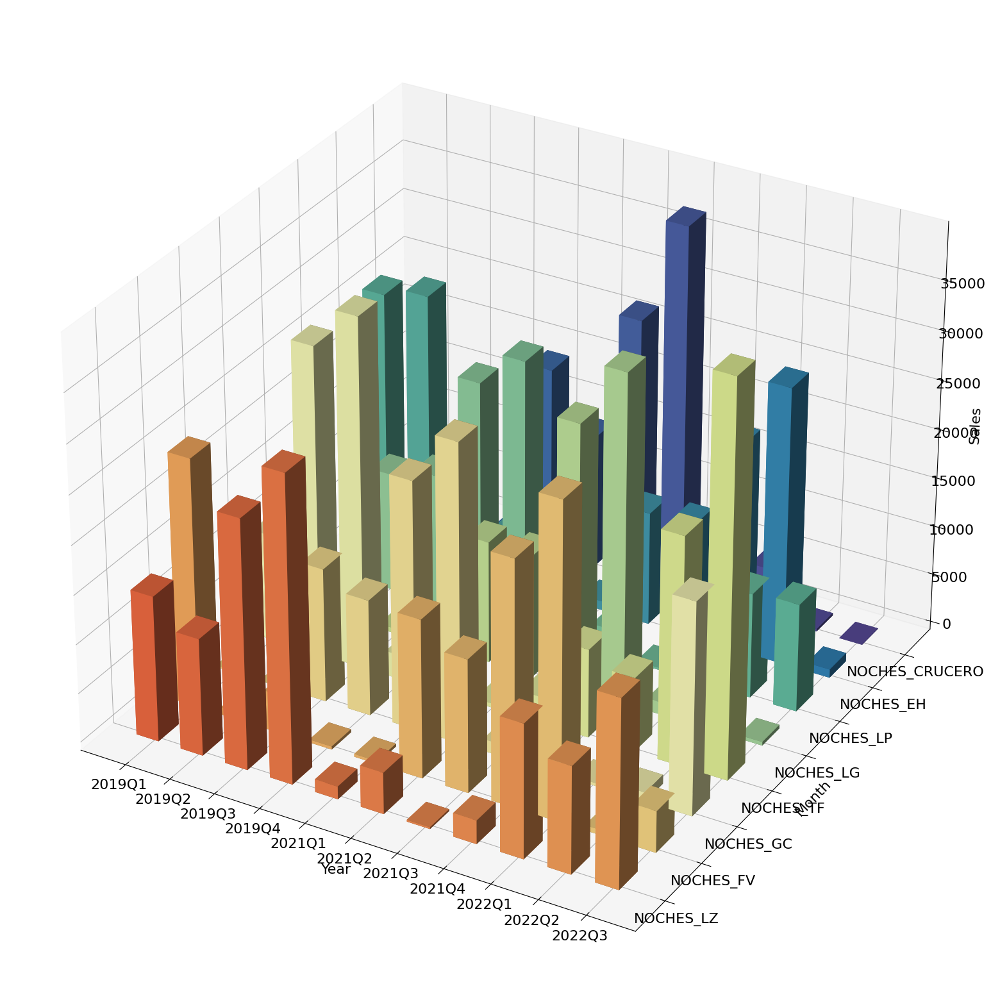

In [16]:
from mpl_toolkits.mplot3d import axes3d
from matplotlib import style


new_df = main_df[['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF', 'NOCHES_LG',
                  'NOCHES_LP', 'NOCHES_EH', 'NOCHES_CRUCERO', 'NOCHES', 'TRIMESTRE']].copy()
new_df = new_df.set_index('TRIMESTRE')

# PROBAR SI SUMA CORRECTAMENTE
new_df = new_df.groupby(new_df.index)['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC',
                                      'NOCHES_TF', 'NOCHES_LG', 'NOCHES_LP', 'NOCHES_EH', 'NOCHES_CRUCERO'].sum()

print(new_df)

cosas_array = new_df[['NOCHES_LZ', 'NOCHES_FV', 'NOCHES_GC', 'NOCHES_TF',
                      'NOCHES_LG', 'NOCHES_LP', 'NOCHES_EH', 'NOCHES_CRUCERO']].to_numpy()

print(cosas_array)

xlabels = new_df.index
ylabels = new_df.columns

print(xlabels)
print(ylabels)

x = np.arange(xlabels.shape[0])
y = np.arange(ylabels.shape[0])

print(x)
print(y)


z = np.vstack(cosas_array).ravel()

print(z)

# Set plotting style
# plt.style.use('fivethirtyeight')

x_M, y_M = np.meshgrid(x, y, copy=False)

print("hola")
print(x_M)
print(y_M)

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Cuadrar axis con su respectivo indice
ax.w_xaxis.set_ticks(x + 0.5/2.)
ax.w_yaxis.set_ticks(y + 0.5/2.)

# Dar a cada axis su respectivo indice
ax.w_xaxis.set_ticklabels(xlabels)
ax.w_yaxis.set_ticklabels(ylabels)

# Labeling the 3 dimensions
ax.set_xlabel('Year')
ax.set_ylabel('Month')
ax.set_zlabel('Sales')


# Choosing the range of values to be extended in the set colormap
values = np.linspace(0.2, 1., x_M.ravel().shape[0])

# Selecting an appropriate colormap
colors = plt.cm.Spectral(values)
# ax.bar3d(x_M.ravel(), y_M.ravel(), z*0, dx=0.5, dy=0.5, dz=z, color=colors, alpha=0.2)
ax.bar3d(x_M.ravel(), y_M.ravel(), z*0, dx=0.5, dy=0.5, dz=z, color=colors)
